# WaterDetect demonstration
This notebook will demonstrate the possibility to use waterdetect inside the Microsoft Planetary for any area/time in the globe.

## Prepare Dask

In [3]:
2+2

4

In [2]:
from dask_gateway import GatewayCluster

cluster = GatewayCluster()
cluster.adapt(minimum=4, maximum=24)

client = cluster.get_client()

cluster

OSError: Timed out during handshake while connecting to gateway://traefik-dhub-prod-dask-gateway.prod:80/prod.22069fb39dea495cb0bbec990f404776 after 30 s

In [ ]:
client

## Define the Point of Interest

In [ ]:
toulouse = {'lon': 1.437568, 'lat': 43.599453}
lavaur = {'lon': 1.837568, 'lat': 43.7}

radius = 0.2 #in degrees
resolution = 20
month = '2021-09'

coords = lavaur

## Functions

In [3]:
import rasterio.features as features

def aoi_from_point_radius(coords, radius):
    lat = coords['lat']
    lon = coords['lon']
    aoi = {
        "type": "Polygon",
        "coordinates": [
            [
                [lon-radius, lat-radius],
                [lon+radius, lat-radius],
                [lon+radius, lat+radius],
                [lon-radius, lat+radius],
            ]
        ],
    }
    
    if features.is_valid_geom(aoi):
        return aoi
    else:
        print(f'Problem creating polygon from Coord: {coords} and radius: {radius}')
        return None



## Get imagery

In [4]:
from pystac_client import Client, ItemSearch
import stackstac
import planetary_computer
import numpy as np
import xarray as xr

In [5]:
stac = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

In [6]:
aoi = aoi_from_point_radius(coords, radius)
bbox = features.bounds(aoi)

In [7]:
search = stac.search(
    bbox=bbox,
    datetime=month,
    collections=["sentinel-2-l2a"],
    limit=500,  # fetch items in batches of 500
    query={"eo:cloud_cover": {"lt": 80}},
)

items = list(search.get_items())
print(len(items))

19


In [8]:
signed_items = [planetary_computer.sign(item).to_dict() for item in items]

In [9]:
# will use the crs from the very first image
epsg = items[0].properties['proj:epsg']
data = (
    stackstac.stack(
        signed_items,
        assets=['B04', "B03", 'B02'],  # red, green, blue
        chunksize=4096,
        resolution=resolution,
        bounds_latlon=bbox,
        epsg=epsg
    )
    .where(lambda x: x > 0, other=np.nan)  # sentinel-2 uses 0 as nodata
#     .assign_coords(band=lambda x: x.common_name.rename("band"))  # use common names
)
data = data.persist()
data

<xarray.DataArray 'stackstac-daa3a6259bed56a7036d704dcf0047a2' (time: 19, band: 3, y: 2245, x: 1644)>
dask.array<where, shape=(19, 3, 2245, 1644), dtype=float64, chunksize=(1, 1, 2245, 1644), chunktype=numpy.ndarray>
Coordinates: (12/44)
  * time                                     (time) datetime64[ns] 2021-09-04...
    id                                       (time) <U54 'S2B_MSIL2A_20210904...
  * band                                     (band) <U3 'B04' 'B03' 'B02'
  * x                                        (x) float64 3.898e+05 ... 4.227e+05
  * y                                        (y) float64 4.862e+06 ... 4.817e+06
    s2:snow_ice_percentage                   (time) float64 0.1618 ... 0.6958
    ...                                       ...
    title                                    (band) <U20 'Band 4 - Red - 10m'...
    gsd                                      int64 10
    common_name                              (band) <U5 'red' 'green' 'blue'
    center_wavelength                        (band) float64 0.665 0.56 0.49
    full_width_half_max                      (band) float64 0.038 0.045 0.098
    epsg                                     int64 32631
Attributes:
    spec:        RasterSpec(epsg=32631, bounds=(389840, 4816780, 422720, 4861...
    crs:         epsg:32631
    transform:   | 20.00, 0.00, 389840.00|\n| 0.00,-20.00, 4861680.00|\n| 0.0...
    resolution:  20

## Load SCL layer and create SCL masks

In [10]:
Sen2CorMaskList = {'NO_DATA': 0,
                   'SATURATED_OR_DEFECTIVE': 1,
                   'DARK_AREA_PIXELS': 2,
                   'CLOUD_SHADOWS': 3,
                   'VEGETATION': 4,
                   'NOT_VEGETATED': 5,
                   'WATER': 6,
                   'UNCLASSIFIED': 7,
                   'CLOUD_MEDIUM_PROBABILITY': 8,
                   'CLOUD_HIGH_PROBABILITY': 9,
                   'THIN_CIRRUS': 10,
                   'SNOW': 11
                   }
mask_keys = ['SNOW', 'THIN_CIRRUS', 'CLOUD_HIGH_PROBABILITY', 'CLOUD_MEDIUM_PROBABILITY', 
             'CLOUD_SHADOWS', 'SATURATED_OR_DEFECTIVE', 'NO_DATA']

In [11]:
scl = (
    stackstac.stack(
        signed_items,
        assets=['SCL'],  # red, green, blue
        chunksize=4096,
        resolution=resolution,
        bounds_latlon=bbox,
        epsg=epsg
    )
    .where(lambda x: x > 0, other=np.nan)  # sentinel-2 uses 0 as nodata
)
scl = scl.astype('uint8').squeeze().persist()
scl

<xarray.DataArray 'stackstac-89cc02cbcf48ac7a94080b72c0c7d1a3' (time: 19, y: 2245, x: 1644)>
dask.array<getitem, shape=(19, 2245, 1644), dtype=uint8, chunksize=(1, 2245, 1644), chunktype=numpy.ndarray>
Coordinates: (12/41)
  * time                                     (time) datetime64[ns] 2021-09-04...
    id                                       (time) <U54 'S2B_MSIL2A_20210904...
    band                                     <U3 'SCL'
  * x                                        (x) float64 3.898e+05 ... 4.227e+05
  * y                                        (y) float64 4.862e+06 ... 4.817e+06
    s2:snow_ice_percentage                   (time) float64 0.1618 ... 0.6958
    ...                                       ...
    s2:reflectance_conversion_factor         (time) object None 0.982 ... 0.9952
    s2:saturated_defective_pixel_percentage  float64 0.0
    proj:shape                               object {5490}
    title                                    <U29 'Scene classfication map (S...
    gsd                                      float64 20.0
    epsg                                     int64 32631
Attributes:
    spec:        RasterSpec(epsg=32631, bounds=(389840, 4816780, 422720, 4861...
    crs:         epsg:32631
    transform:   | 20.00, 0.00, 389840.00|\n| 0.00,-20.00, 4861680.00|\n| 0.0...
    resolution:  20

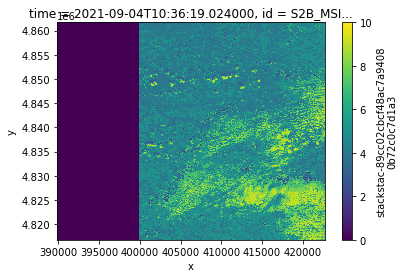

In [12]:
scl[0].plot()

In [13]:
# create masks cube
mask_cube = xr.zeros_like(scl).astype('bool')

# combine the masks
for mask_key in mask_keys:
    mask_cube |= (scl == Sen2CorMaskList[mask_key.upper()])

mask_cube = mask_cube.squeeze(drop=True)
mask_cube

<xarray.DataArray 'stackstac-89cc02cbcf48ac7a94080b72c0c7d1a3' (time: 19, y: 2245, x: 1644)>
dask.array<or_, shape=(19, 2245, 1644), dtype=bool, chunksize=(1, 2245, 1644), chunktype=numpy.ndarray>
Coordinates: (12/41)
  * time                                     (time) datetime64[ns] 2021-09-04...
    id                                       (time) <U54 'S2B_MSIL2A_20210904...
    band                                     <U3 'SCL'
  * x                                        (x) float64 3.898e+05 ... 4.227e+05
  * y                                        (y) float64 4.862e+06 ... 4.817e+06
    s2:snow_ice_percentage                   (time) float64 0.1618 ... 0.6958
    ...                                       ...
    s2:reflectance_conversion_factor         (time) object None 0.982 ... 0.9952
    s2:saturated_defective_pixel_percentage  float64 0.0
    proj:shape                               object {5490}
    title                                    <U29 'Scene classfication map (S...
    gsd                                      float64 20.0
    epsg                                     int64 32631
Attributes:
    spec:        RasterSpec(epsg=32631, bounds=(389840, 4816780, 422720, 4861...
    crs:         epsg:32631
    transform:   | 20.00, 0.00, 389840.00|\n| 0.00,-20.00, 4861680.00|\n| 0.0...
    resolution:  20

In [14]:
masked_data = data.where(~mask_cube)

In [15]:
masked_data

<xarray.DataArray 'stackstac-daa3a6259bed56a7036d704dcf0047a2' (time: 19, band: 3, y: 2245, x: 1644)>
dask.array<where, shape=(19, 3, 2245, 1644), dtype=float64, chunksize=(1, 1, 2245, 1644), chunktype=numpy.ndarray>
Coordinates: (12/41)
  * time                                     (time) datetime64[ns] 2021-09-04...
    id                                       (time) <U54 'S2B_MSIL2A_20210904...
  * band                                     (band) <U3 'B04' 'B03' 'B02'
  * x                                        (x) float64 3.898e+05 ... 4.227e+05
  * y                                        (y) float64 4.862e+06 ... 4.817e+06
    s2:snow_ice_percentage                   (time) float64 0.1618 ... 0.6958
    ...                                       ...
    s2:reflectance_conversion_factor         (time) object None 0.982 ... 0.9952
    s2:saturated_defective_pixel_percentage  float64 0.0
    common_name                              (band) <U5 'red' 'green' 'blue'
    center_wavelength                        (band) float64 0.665 0.56 0.49
    full_width_half_max                      (band) float64 0.038 0.045 0.098
    epsg                                     int64 32631
Attributes:
    spec:        RasterSpec(epsg=32631, bounds=(389840, 4816780, 422720, 4861...
    crs:         epsg:32631
    transform:   | 20.00, 0.00, 389840.00|\n| 0.00,-20.00, 4861680.00|\n| 0.0...
    resolution:  20

## Display imagery

In [ ]:
masked_data.plot(row='time', col='band')

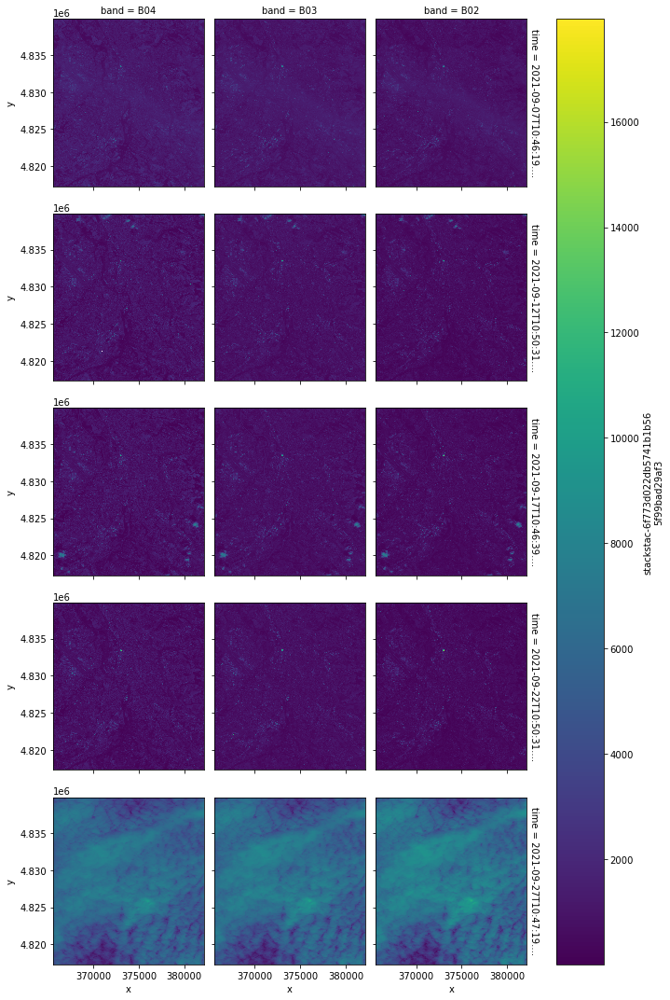

In [248]:
data.plot(row='time', col='band')

## Mosaic results

In [19]:
import xrspatial.multispectral as ms
from PIL import Image

In [20]:
rgb_mosaic = masked_data.median(dim='time')
masked = xr.ufuncs.isnan(rgb_mosaic)

In [21]:
final_mosaic = rgb_mosaic.where(~masked, 1)

In [22]:
# this is the 2D final mask, to be used to apply a color
mask = masked.any(dim='band').to_numpy()

In [23]:
image = ms.true_color(final_mosaic.loc['B04'], final_mosaic.loc['B03'], final_mosaic.loc['B02'], c=20, th=0.1, nodata=0).to_numpy()

In [24]:
image[mask] = [255, 200, 200, 255]

In [25]:
image.shape

(2245, 1644, 4)

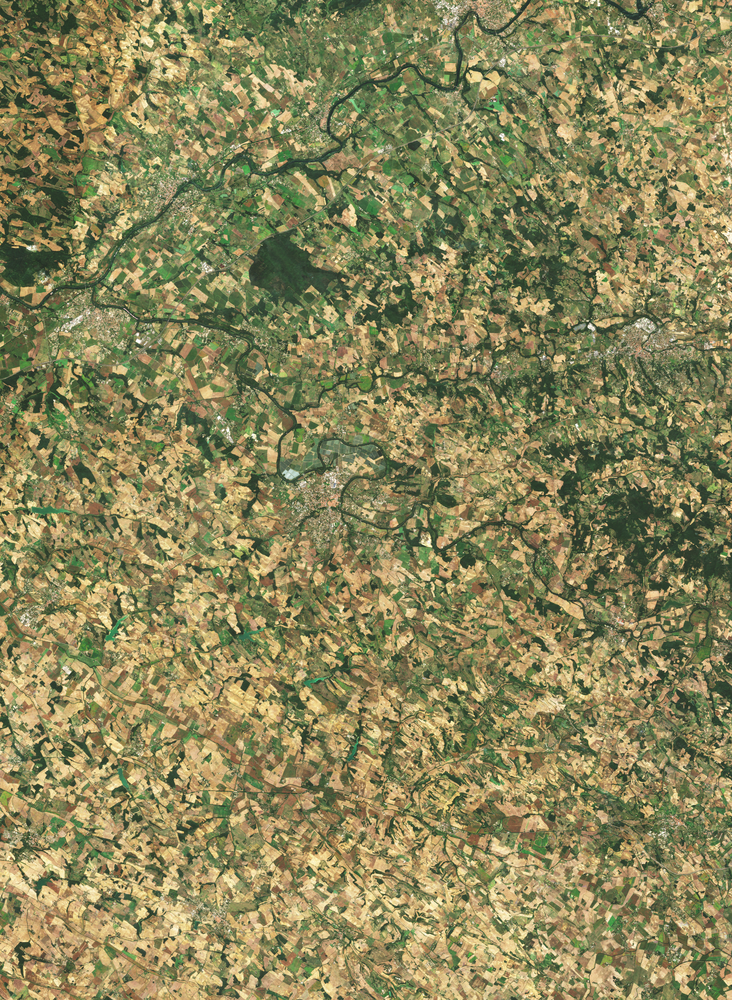

distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client
_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
asyncio.exceptions.CancelledError
Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/srv/conda/envs/notebook/lib/python3.8/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:1131)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/asyncio/events.py", line 81, in _run
    self._context.run(self._callback, *self._args)
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/platform/asyncio.py", line 1

In [26]:
Image.fromarray(image)

# Testing Single Scenes

In [262]:
scene_idx = 0
scene = data.sel(time=data.time[scene_idx]).persist()
scl_scene = scl.sel(time=data.time[scene_idx]).squeeze().persist()
scl_scene

<xarray.DataArray 'stackstac-6be25a87ef2d1470f07f9beea1964550' (y: 1127, x: 829)>
dask.array<getitem, shape=(1127, 829), dtype=uint8, chunksize=(1127, 829), chunktype=numpy.ndarray>
Coordinates: (12/43)
    time                                     datetime64[ns] 2021-09-07T10:46:...
    id                                       <U54 'S2B_MSIL2A_20210907T104619...
    band                                     <U3 'SCL'
  * x                                        (x) float64 3.656e+05 ... 3.821e+05
  * y                                        (y) float64 4.84e+06 ... 4.817e+06
    s2:cloud_shadow_percentage               float64 0.03189
    ...                                       ...
    title                                    <U29 'Scene classfication map (S...
    proj:bbox                                object {300000.0, 4900020.0, 479...
    proj:transform                           object {0.0, 300000.0, -20.0, 20...
    proj:shape                               object {5490}
    gsd                                      float64 20.0
    epsg                                     int64 32631
Attributes:
    spec:        RasterSpec(epsg=32631, bounds=(365580, 4817300, 382160, 4839...
    crs:         epsg:32631
    transform:   | 20.00, 0.00, 365580.00|\n| 0.00,-20.00, 4839840.00|\n| 0.0...
    resolution:  20

In [263]:
import xrspatial.multispectral as ms
from PIL import Image

def create_scl_mask(scl, mask_keys=None):
    if mask_keys is None:
        mask_keys = ['SNOW', 'THIN_CIRRUS', 'CLOUD_HIGH_PROBABILITY', 'CLOUD_MEDIUM_PROBABILITY', 
                     'CLOUD_SHADOWS', 'SATURATED_OR_DEFECTIVE', 'NO_DATA']
        
    # create masks cube
    mask_cube = xr.zeros_like(scl).astype('bool')

    # combine the masks
    for mask_key in mask_keys:
        mask_cube |= (scl == Sen2CorMaskList[mask_key.upper()])

    mask_cube = mask_cube.squeeze(drop=True)
    return mask_cube    

def show_rgb(array, bands=['B04', 'B03', 'B02'], mask=None):
    image = ms.true_color(array.loc['B04'], array.loc['B03'], array.loc['B02'], c=20, th=0.1, nodata=0).to_numpy()
    if mask is not None:
        mask = mask.to_numpy()
        image[mask] = [255, 155, 155, 255]
        
    return Image.fromarray(image)

In [264]:
mask_scene = create_scl_mask(scl_scene)
mask_scene

<xarray.DataArray 'stackstac-6be25a87ef2d1470f07f9beea1964550' (y: 1127, x: 829)>
dask.array<or_, shape=(1127, 829), dtype=bool, chunksize=(1127, 829), chunktype=numpy.ndarray>
Coordinates: (12/43)
    time                                     datetime64[ns] 2021-09-07T10:46:...
    id                                       <U54 'S2B_MSIL2A_20210907T104619...
    band                                     <U3 'SCL'
  * x                                        (x) float64 3.656e+05 ... 3.821e+05
  * y                                        (y) float64 4.84e+06 ... 4.817e+06
    s2:cloud_shadow_percentage               float64 0.03189
    ...                                       ...
    title                                    <U29 'Scene classfication map (S...
    proj:bbox                                object {300000.0, 4900020.0, 479...
    proj:transform                           object {0.0, 300000.0, -20.0, 20...
    proj:shape                               object {5490}
    gsd                                      float64 20.0
    epsg                                     int64 32631
Attributes:
    spec:        RasterSpec(epsg=32631, bounds=(365580, 4817300, 382160, 4839...
    crs:         epsg:32631
    transform:   | 20.00, 0.00, 365580.00|\n| 0.00,-20.00, 4839840.00|\n| 0.0...
    resolution:  20

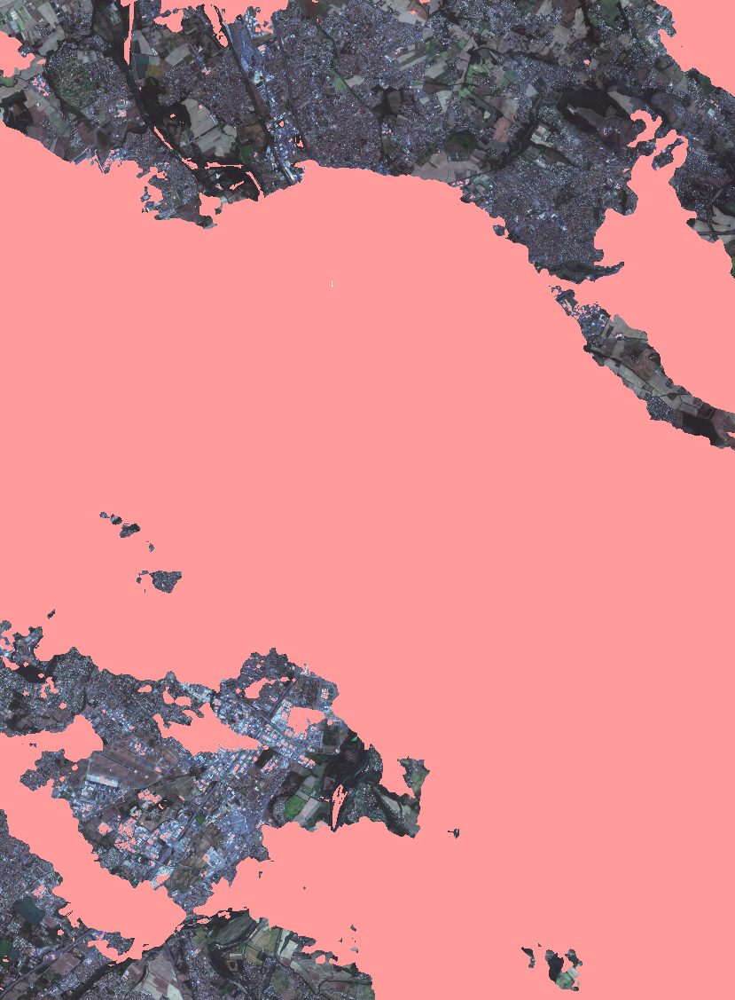

In [265]:
show_rgb(scene, mask=mask_scene)

In [15]:
data.shape

(8, 3, 2253, 1658)

In [34]:
items[0].properties[']

{'datetime': '2021-08-31T10:56:19.024000Z',
 'platform': 'Sentinel-2B',
 'proj:epsg': 32631,
 'instruments': ['msi'],
 's2:mgrs_tile': '31TCK',
 'constellation': 'Sentinel 2',
 's2:granule_id': 'S2B_OPER_MSI_L2A_TL_ESRI_20210831T234715_A023429_T31TCK_N03.00',
 'eo:cloud_cover': 0.103265,
 's2:datatake_id': 'GS2B_20210831T105619_023429_N03.00',
 's2:product_uri': 'S2B_MSIL2A_20210831T105619_N0300_R094_T31TCK_20210831T234714.SAFE',
 's2:datastrip_id': 'S2B_OPER_MSI_L2A_DS_ESRI_20210831T234715_S20210831T105909_N03.00',
 's2:product_type': 'S2MSI2A',
 'sat:orbit_state': 'descending',
 's2:datatake_type': 'INS-NOBS',
 's2:generation_time': '2021-08-31T23:47:14.458155Z',
 'sat:relative_orbit': 94,
 's2:water_percentage': 0.342131,
 's2:mean_solar_zenith': 37.5815907454493,
 's2:mean_solar_azimuth': 160.753901281245,
 's2:processing_baseline': '03.00',
 's2:snow_ice_percentage': 0.0,
 's2:vegetation_percentage': 84.297949,
 's2:thin_cirrus_percentage': 0.014684,
 's2:cloud_shadow_percentage':

In [18]:
ItemSearch?

Init signature:
ItemSearch(
    url: str,
    *,
    limit: Union[int, NoneType] = None,
    bbox: Union[Tuple[float, ...], List[float], Iterator[float], str, NoneType] = None,
    datetime: Union[datetime.datetime, str, NoneType, Tuple[Union[datetime.datetime, str, NoneType], Union[datetime.datetime, str, NoneType]], List[Union[datetime.datetime, str, NoneType]], Iterator[Union[datetime.datetime, str, NoneType]]] = None,
    intersects: Union[str, dict, object, NoneType] = None,
    ids: Union[Tuple[str, ...], str, List[str], Iterator[str], NoneType] = None,
    collections: Union[List[str], Iterator[str], str, NoneType] = None,
    query: Union[dict, List[str], NoneType] = None,
    filter: Union[dict, NoneType] = None,
    sortby: Union[List[str], str, NoneType] = None,
    fields: Union[List[str], str, NoneType] = None,
    max_items: Union[int, NoneType] = None,
    method: Union[str, NoneType] = 'POST',
    stac_io: Union[pystac.stac_io.StacIO, NoneType] = None,
    client: Union

In [ ]:
aoi = rasterio.warp.transform_geom('EPSG:4326', 'EPSG:32610', area_of_interest)



bbox = rasterio.features.bounds(area_of_interest)
bbox